<a href="https://colab.research.google.com/github/Sparsh-mahajan/Image_processing_assignment/blob/main/ivp_assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import os

In [5]:
from PIL import Image
import requests
from io import BytesIO

#enter URL of the image. open the image in new tab first and then copy and paste the URL here.
url = "https://marketplace.canva.com/EAFHm4JWsu8/1/0/1600w/canva-pink-landscape-desktop-wallpaper-HGxdJA_xIx0.jpg"

def getImageFromURL(url):
  response = requests.get(url)
  im = Image.open(BytesIO(response.content))
  im.save('image.jpg')


# Question 1 : Read, write and Display an Image.

In [6]:
getImageFromURL(url)
img = cv2.imread('image.jpg')


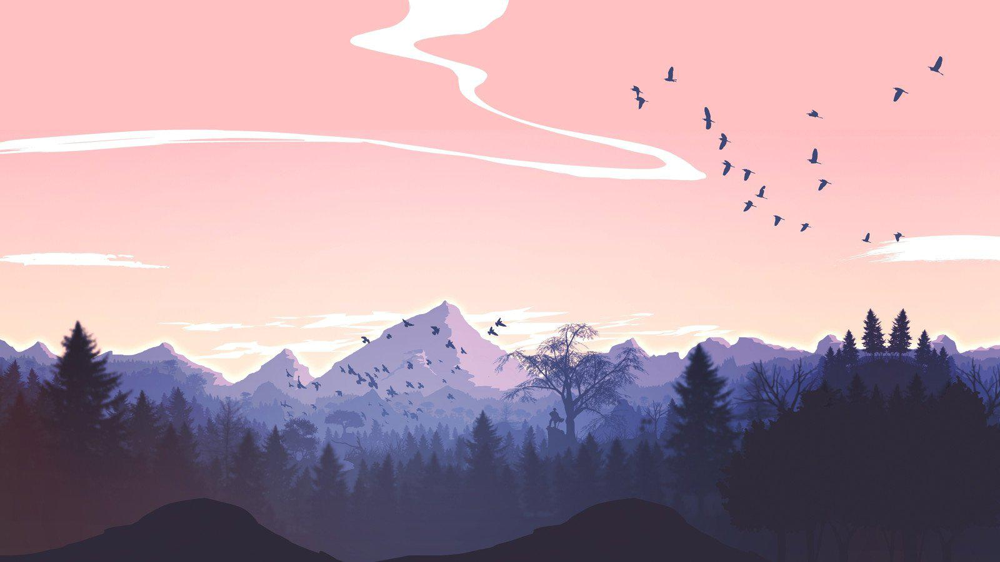

In [7]:
cv2_imshow(img)


# Question 2 : Mirror and flip an image.

### mirroring

In [8]:
h, w, c = img.shape
print('height :', h, '\nwidth :', w, '\ncolor channels : ', c)

height : 900 
width : 1600 
color channels :  3


In [9]:
def mirror(img):
  opImg = img.copy()
  for col in range(w//2):
    opImg[:, col] = opImg[:, w - 1 - col]
  return opImg

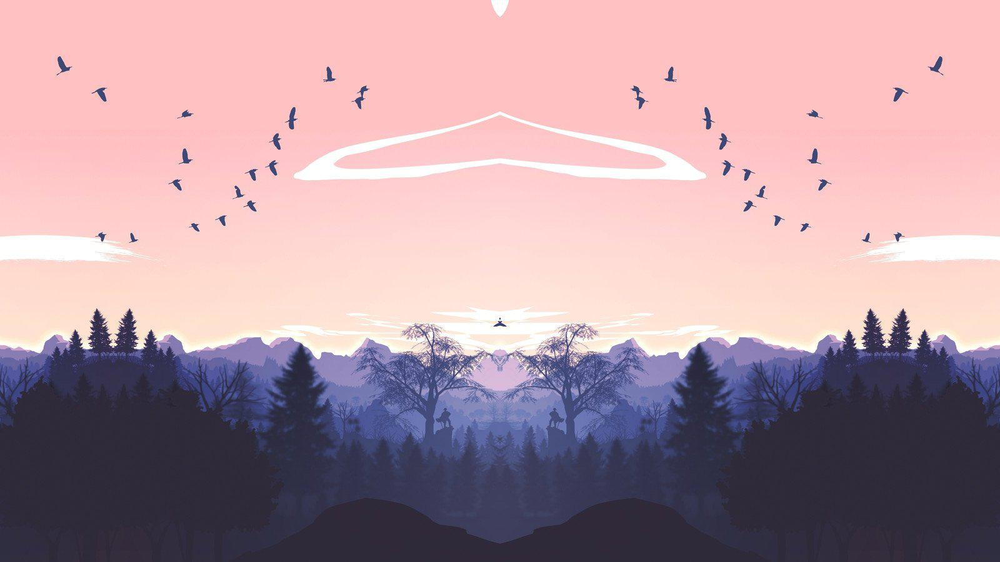

In [10]:
cv2_imshow(mirror(img))

### flipping the image

In [11]:
def flip(img):
  opImg = img.copy()
  for col in range(w//2):
    temp = opImg[:, col].copy()
    opImg[:, col] = opImg[:, w - 1 - col]
    opImg[:, w - 1 - col] = temp
  return opImg

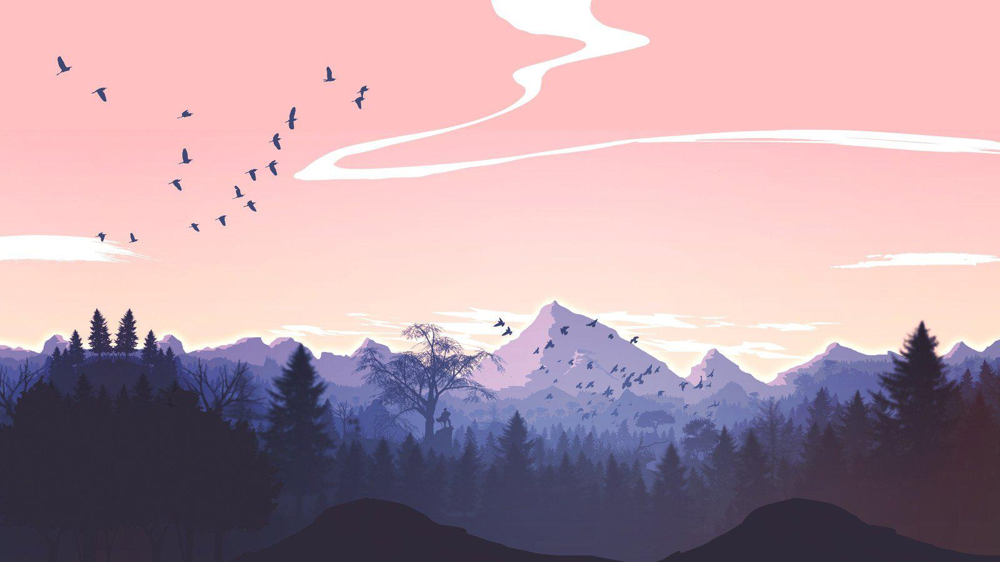

In [12]:
cv2_imshow(flip(img))

# Question 3 : Divide an image into different parts.

In [13]:
def showInParts(img, n_rows, n_cols, spacing):
  h, w, c = img.shape
  tile_height = h // n_rows
  tile_width = w // n_cols
 
  opImgList = []
  col_blank = np.zeros(shape = (tile_height, spacing, c))
 
  for row in range(n_rows):
    colImg = np.zeros(shape = (tile_height, 0, c))
    for col in range(n_cols):
      x0 = row * tile_height
      x1 = x0 + tile_height
      y0 = col * tile_width
      y1 = y0 + tile_width
 
      colImg = np.concatenate((colImg, img[x0 : x1, y0 : y1], col_blank), axis=1)
    opImgList.append(colImg)
 
  _, w_dash , _ = opImgList[0].shape
  opImg = np.zeros(shape = (1, w_dash, c))
  row_blank = np.zeros(shape = (spacing, w_dash, c))
 
  for im in opImgList:
    opImg = np.concatenate((opImg, row_blank, im), axis = 0)
 
  return opImg

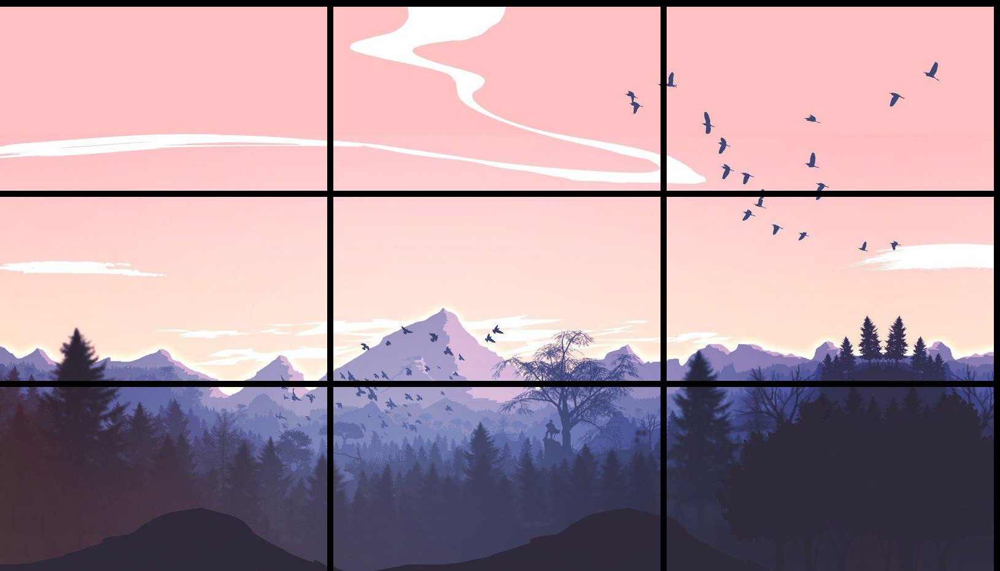

In [14]:
cv2_imshow(showInParts(img, 3, 3, 10))

# Question 4 : Read a gray-scale image, modify the pixel intensities which are greater than 120 as white, less than 50 as black and rest as unmodified.

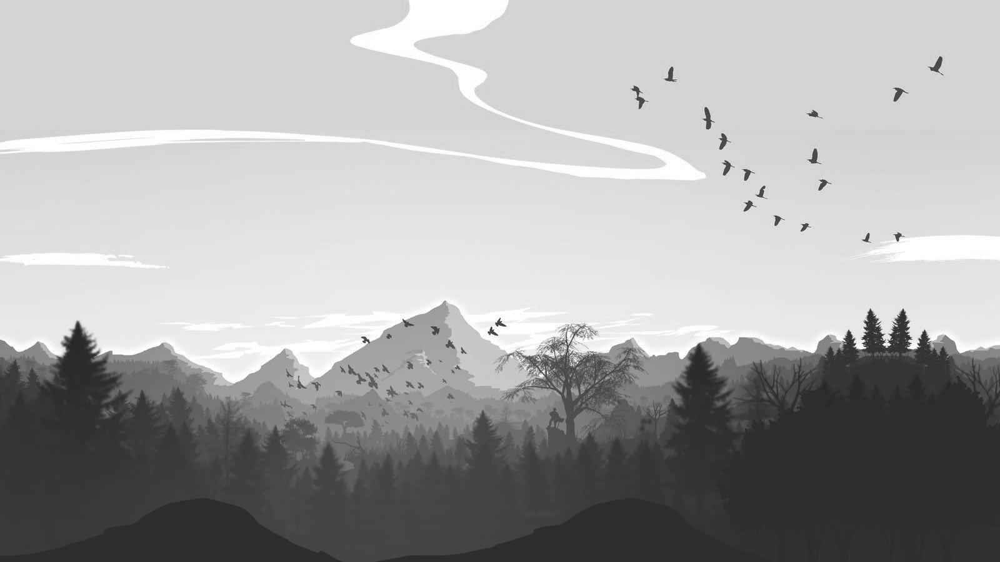

In [15]:
greyImg = img.copy()
greyImg = cv2.cvtColor(greyImg, cv2.COLOR_BGR2GRAY)
cv2_imshow(greyImg)

In [16]:
def clip(img, low, high):
  opImg = img.copy()
  for row in range(opImg.shape[0]):
    for col in range(opImg.shape[1]):
      if(opImg[row, col] < low):
        opImg[row, col] = 0
      elif(opImg[row, col] > high):
        opImg[row, col] = 255
  return opImg

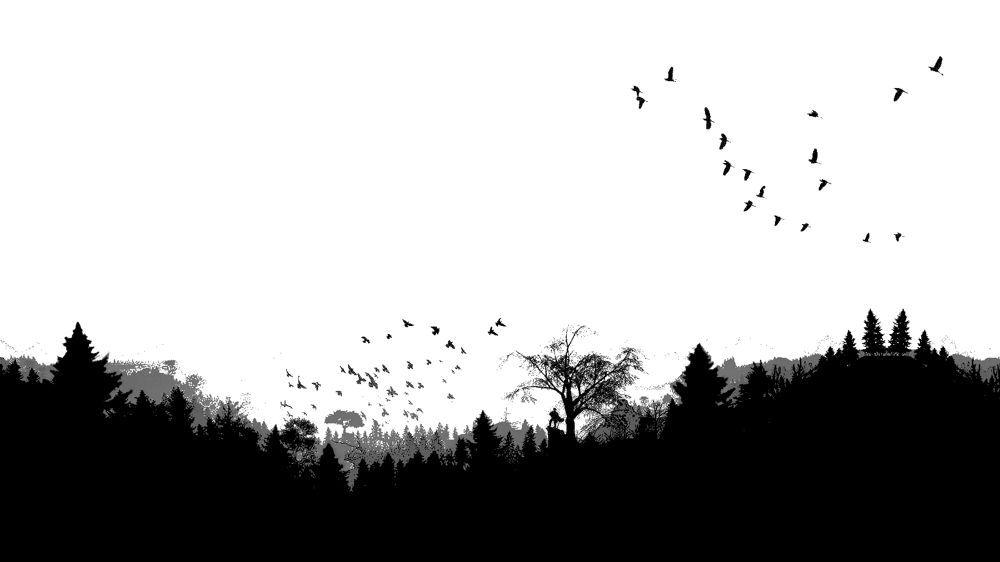

In [17]:
cv2_imshow(clip(greyImg, 90, 120))

# Question 5 : Find the mean of a gray-scale image and set it as the threshold value. Using the threshold value convert the image into binary image and display it.

In [18]:
greyImg

array([[212, 212, 212, ..., 212, 212, 212],
       [212, 212, 212, ..., 212, 212, 212],
       [212, 212, 212, ..., 212, 212, 212],
       ...,
       [ 45,  45,  45, ...,  49,  49,  49],
       [ 45,  45,  45, ...,  49,  49,  49],
       [ 45,  45,  45, ...,  49,  49,  49]], dtype=uint8)

In [19]:
mean = np.mean(greyImg)
print(mean)

165.56059930555554


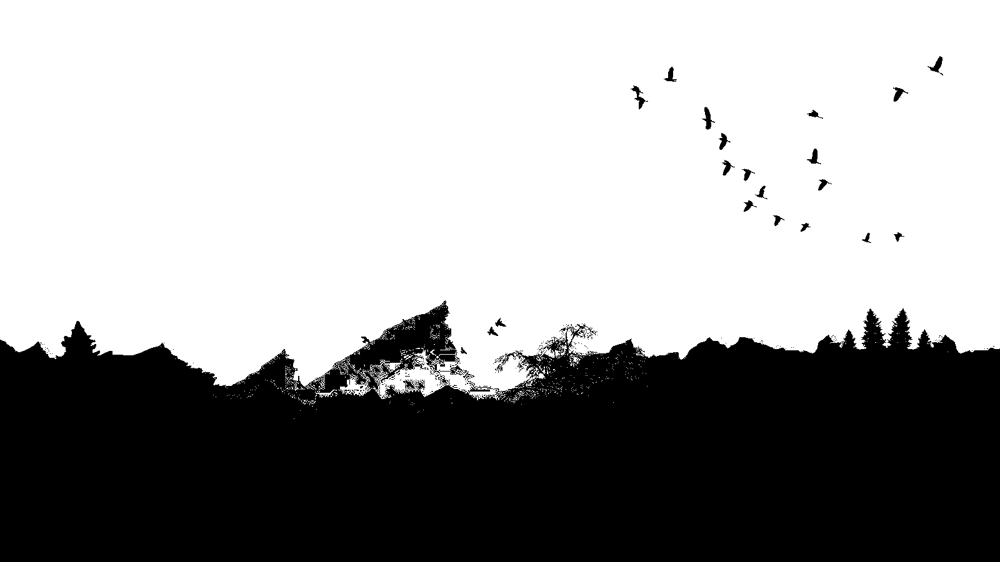

In [20]:
cv2_imshow(clip(greyImg, mean, mean))

# Question 6 : Vary the resolution of an image from 1 bit to 8 bit.

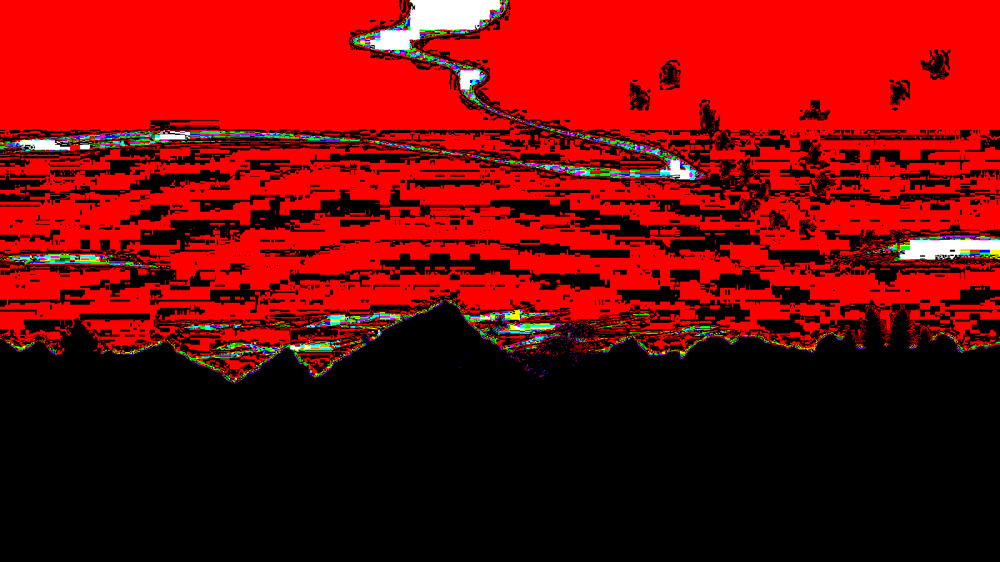

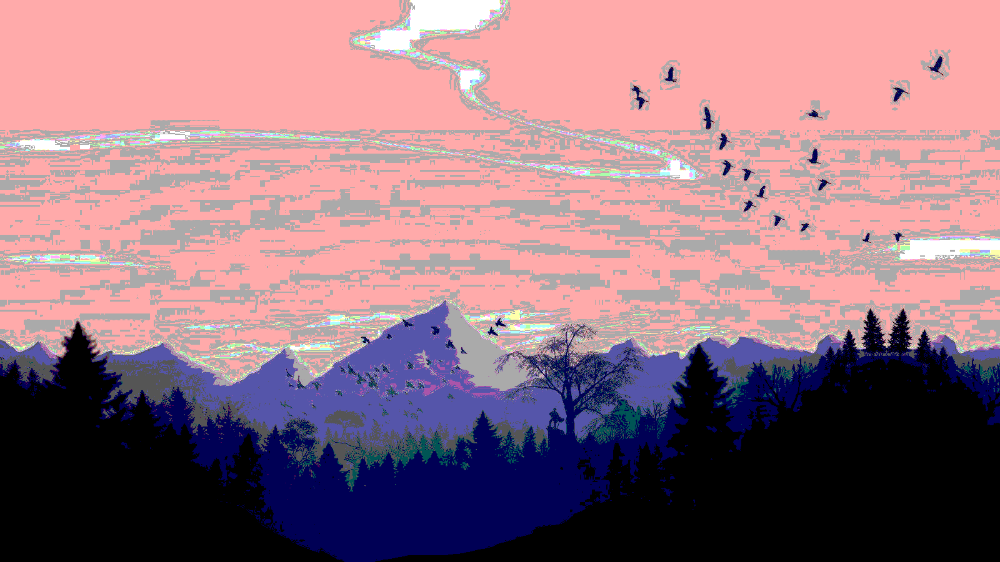

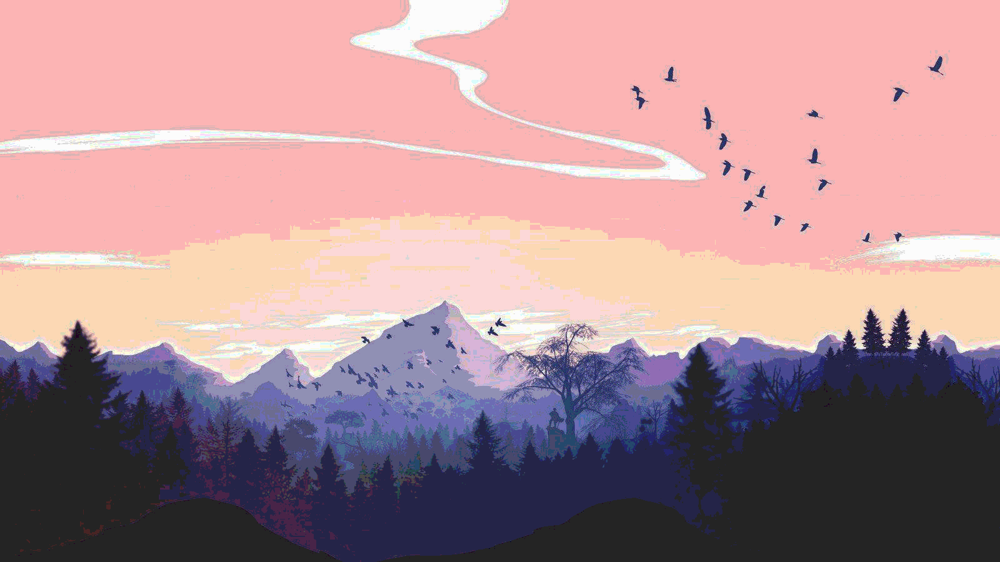

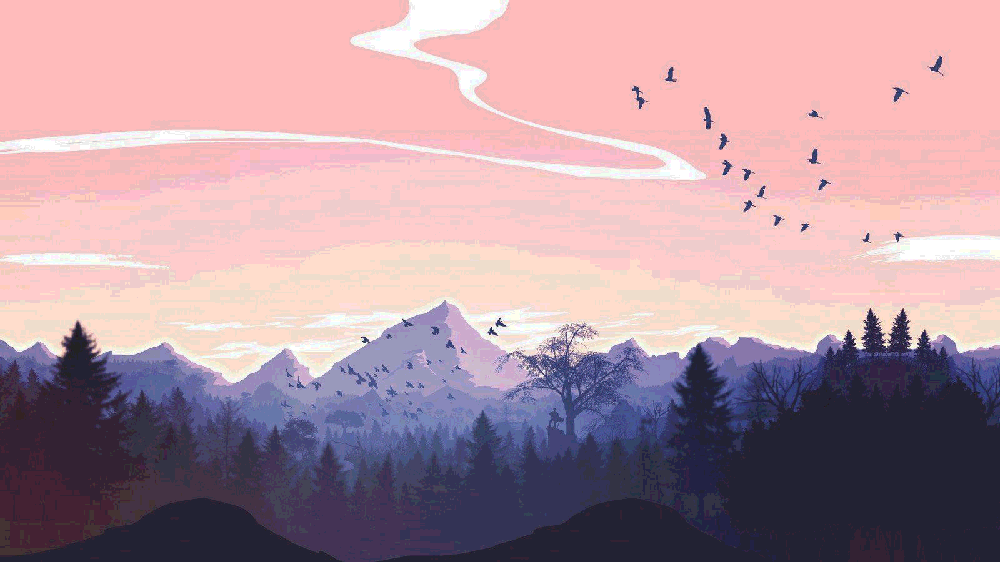

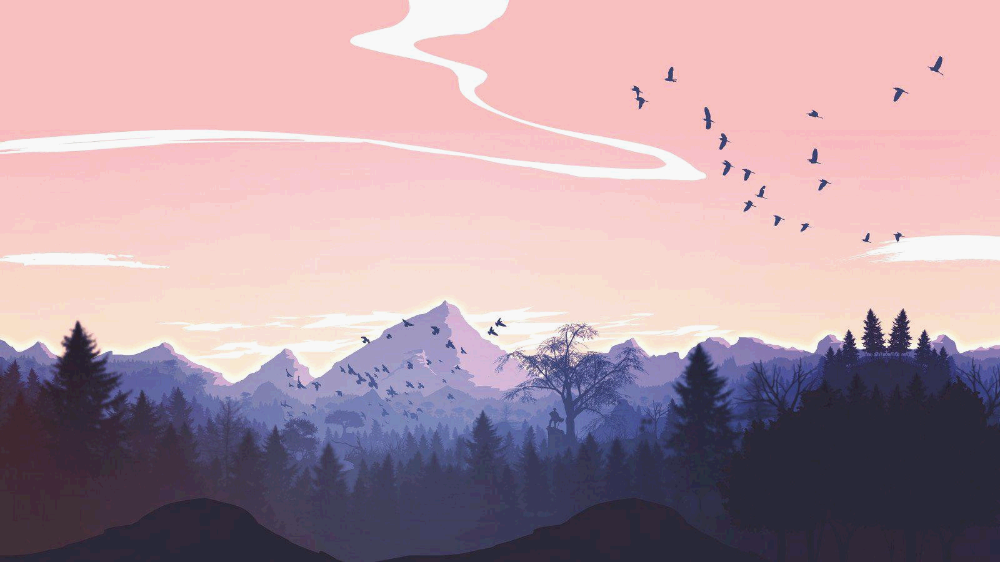

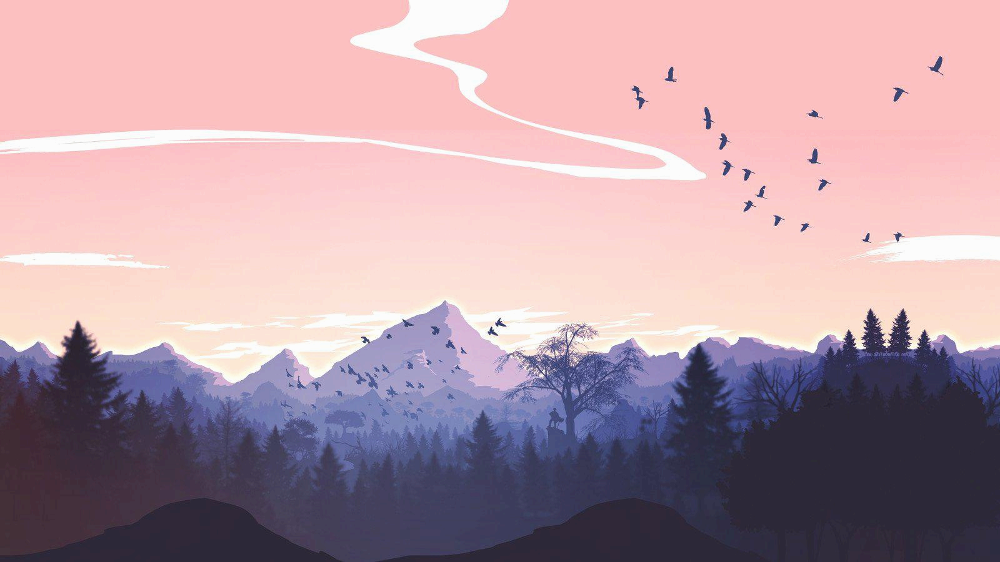

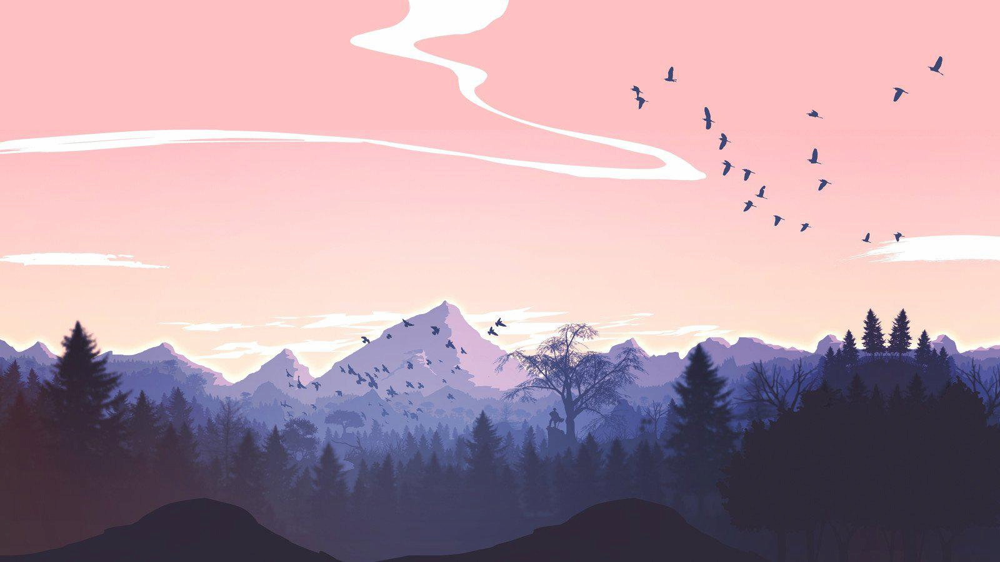

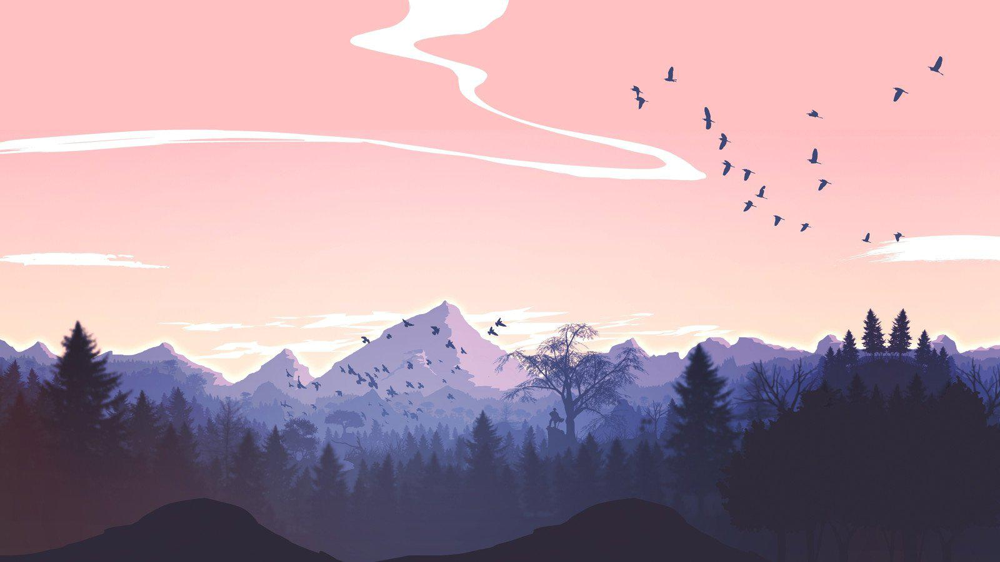

In [21]:
def bitRes(img, bits):
  opImg = img.copy()
  max_bit_val = 2**bits - 1
  opImg = (opImg // (255 // max_bit_val)) * (255 // max_bit_val)
  return opImg

for bits in range(1, 9):
  cv2_imshow(bitRes(img, bits))

# Question 7 : Read an gray scale image and write a program to zoom and shrink the image using

a. Pixel replication method.                                             
b. Interpolation method.

In [22]:
img.shape

(900, 1600, 3)

Zoomed:


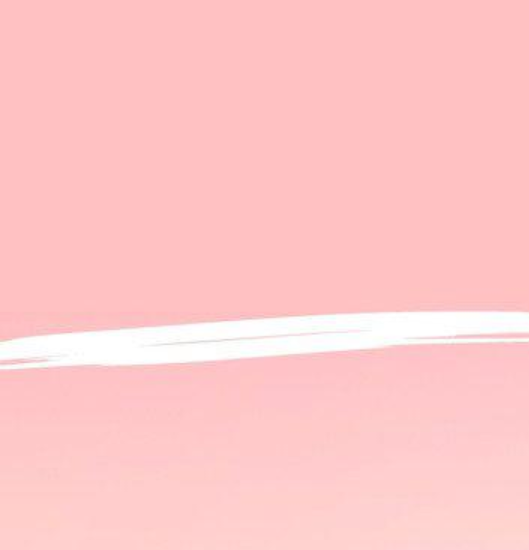

Shrinked:


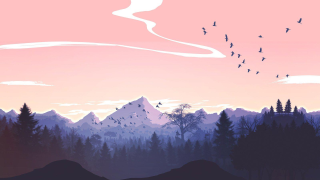

In [23]:
height, width = img.shape[:2]

def zoom(img, zoom_factor=1.5):
    return cv2.resize(img, None, fx=zoom_factor, fy=zoom_factor)

zoomed = zoom(img, 1.5)
# Zoomed: 794 × 825 

print('Zoomed:')

cropped = zoomed[0:550, 0:529]
# cv2.imwrite('zoomed.png', zoomed)
cv2_imshow(cropped)

print('Shrinked:')

 
# img = cv2.imread('/home/img/python.png', cv2.IMREAD_UNCHANGED)
 
 
scale_percent = 20 # percent of original size
width = int(img.shape[1] * scale_percent / 100)
height = int(img.shape[0] * scale_percent / 100)
dim = (width, height)
  
# resize image
resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
 
cv2_imshow(resized)

# Question 8 : Read a gray scale image and negate the image.

In [24]:
max = np.max(greyImg)
max_bits = np.round(np.math.log2(max))
print(max_bits)

8.0


In [25]:
max_pixel_val = 2 ** max_bits - 1
print(max_pixel_val)

255.0


In [26]:
def invert(img):
  opImg = img.copy()
  max = np.max(greyImg)
  max_bits = np.round(np.math.log2(max))
  max_pixel_val = 2 ** max_bits - 1
  opImg = max_pixel_val - opImg #using numpy's vectorization to avoid for loops
  return opImg

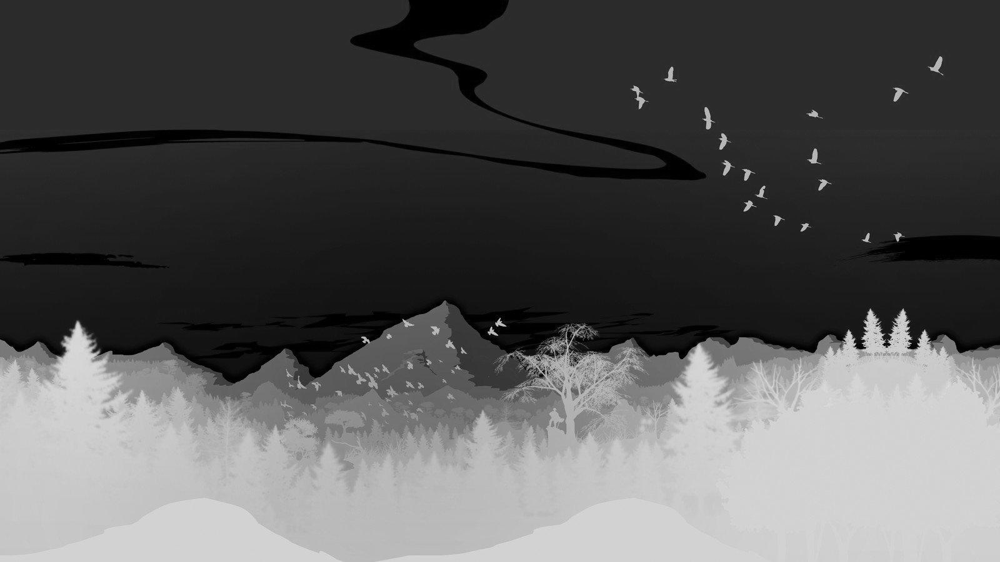

In [27]:
cv2_imshow(invert(greyImg))

# Question 9 : Read a RGB image. Extract its red, green, and blue components and display it individually.

### color format in OpenCV is handled in the BGR format - i.e., Blue Green Red

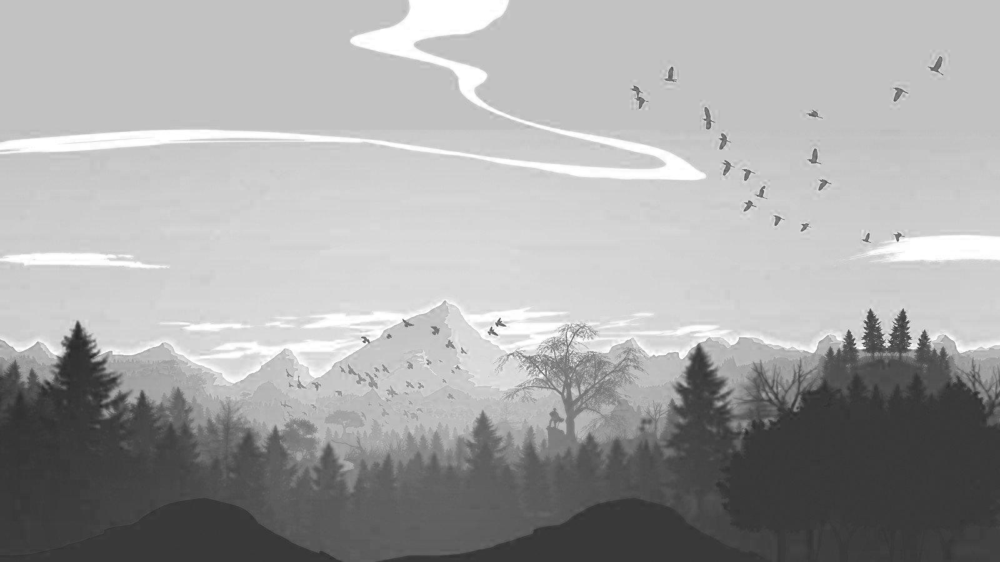

In [28]:
#blue channel
cv2_imshow(img[:, :, 0])

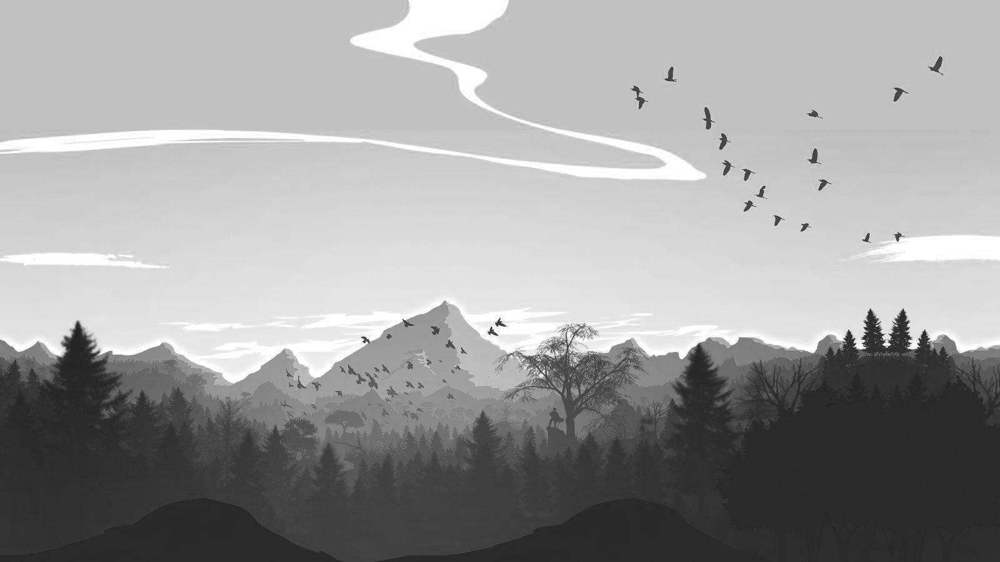

In [29]:
#green channel
cv2_imshow(img[:, :, 1])

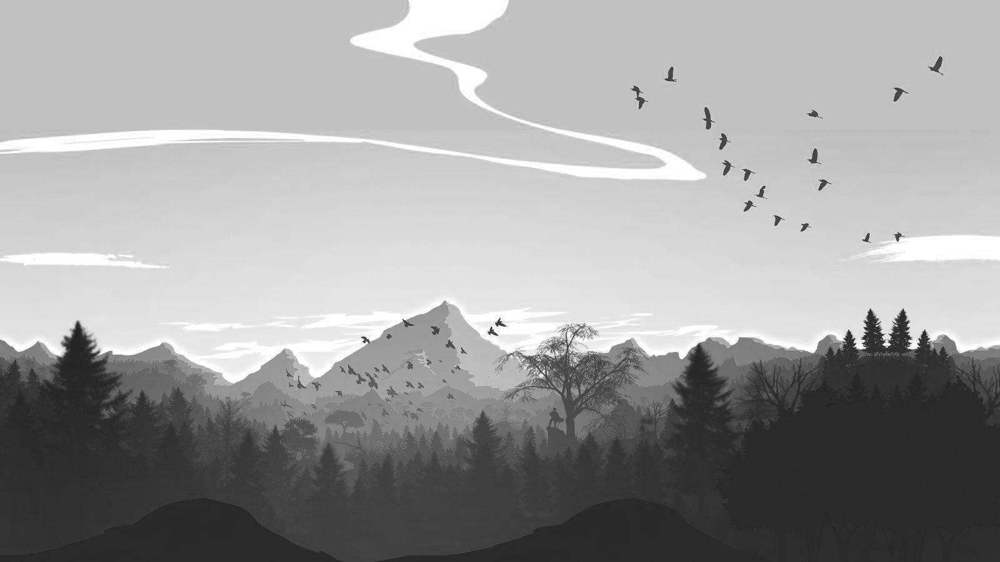

In [30]:
#red channel
cv2_imshow(img[:, :, 1])

# Question 10 : Read a RGB image and convert it to a YIQ model and reconvert it back to RGB.

In [31]:
def transformRGB2YIQ(imgRGB: np.ndarray) -> np.ndarray:
    """
    Converts an RGB image to YIQ color space
    :param imgRGB: An Image in RGB
    :return: A YIQ in image color space
    """
    yiq_from_rgb = np.array([[0.299, 0.587, 0.114],
                             [0.59590059, -0.27455667, -0.32134392],
                             [0.21153661, -0.52273617, 0.31119955]])
    OrigShape=imgRGB.shape
    return np.dot(imgRGB.reshape(-1,3), yiq_from_rgb.transpose()).reshape(OrigShape)

    pass


def transformYIQ2RGB(imgYIQ: np.ndarray) -> np.ndarray:
    """
    Converts an YIQ image to RGB color space
    :param imgYIQ: An Image in YIQ
    :return: A RGB in image color space
    """
    yiq_from_rgb = np.array([[0.299, 0.587, 0.114],
                             [0.59590059, -0.27455667, -0.32134392],
                             [0.21153661, -0.52273617, 0.31119955]])
    OrigShape=imgYIQ.shape
    return np.dot(imgYIQ.reshape(-1,3), np.linalg.inv(yiq_from_rgb).transpose()).reshape(OrigShape)

    pass

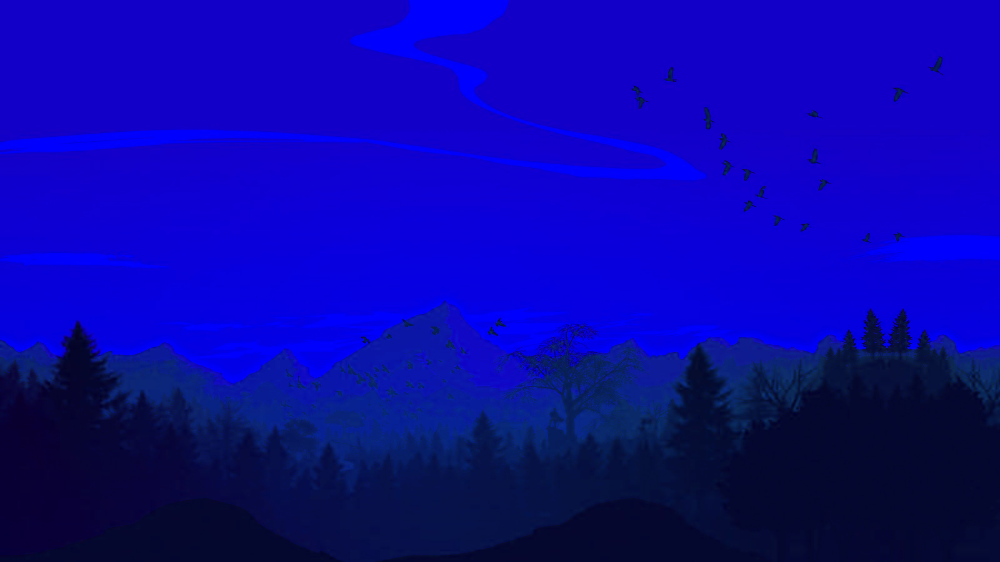

In [32]:
yiqImg = transformRGB2YIQ(img.copy())
cv2_imshow(yiqImg)

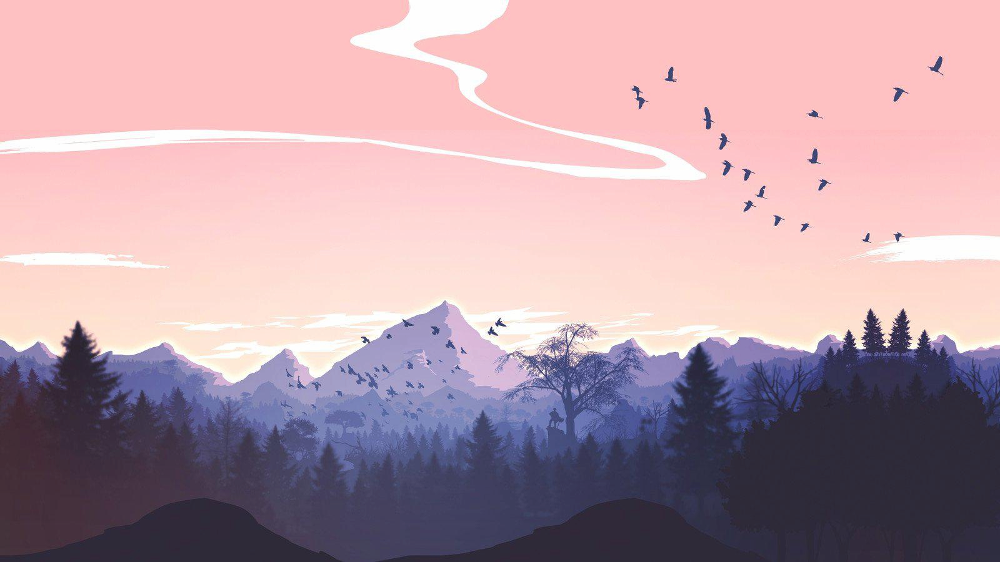

In [33]:
rgbImg = transformYIQ2RGB(yiqImg.copy())
cv2_imshow(rgbImg)

# Question 11 : Convert an RGB image to indexed image and followed by RGB image.

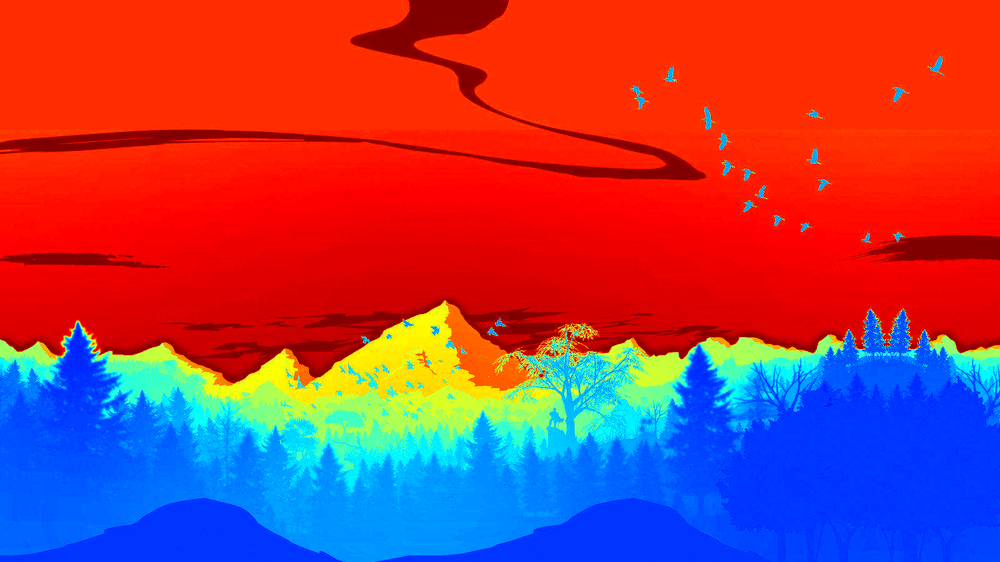

In [34]:
indexed_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
indexed_image = cv2.applyColorMap(img, cv2.COLORMAP_JET)
cv2_imshow(indexed_image)

# Question 12 : Convert the RGB image into CMY model and CMY model into RGB model.

In [35]:
def transformRGB2CMYK(img):
  BGRImg = img.copy()
  BGRImg = BGRImg.astype(float)/255.0
  #calculate K
  K = 1 - np.max(BGRImg, axis=2)
  #calculate C
  C = (1-BGRImg[:, :, 2] - K)/(1-K) #cyan from red channel.
  # Calculate M
  M = (1-BGRImg[:, :, 1] - K)/(1-K) #magenta from green channel.
  # Calculate Y
  Y = (1-BGRImg[:, :, 0] - K)/(1-K) #yellow from blue channel.
  opImg = (np.dstack((C,M,Y,K)) * 255)
  return opImg

def transformCMYK2RGB(img):
  CMYKImg = img.copy()
  CMYKImg = CMYKImg.astype(float)/255.0

  C = CMYKImg[:, :, 0]
  M = CMYKImg[:, :, 1]
  Y = CMYKImg[:, :, 2]
  K = CMYKImg[:, :, 3]

  R = (C-1) * (K-1)
  G = (M-1) * (K-1)
  B = (Y-1) * (K-1)

  opImg = (np.dstack((B, G, R)) * 255)
  return opImg

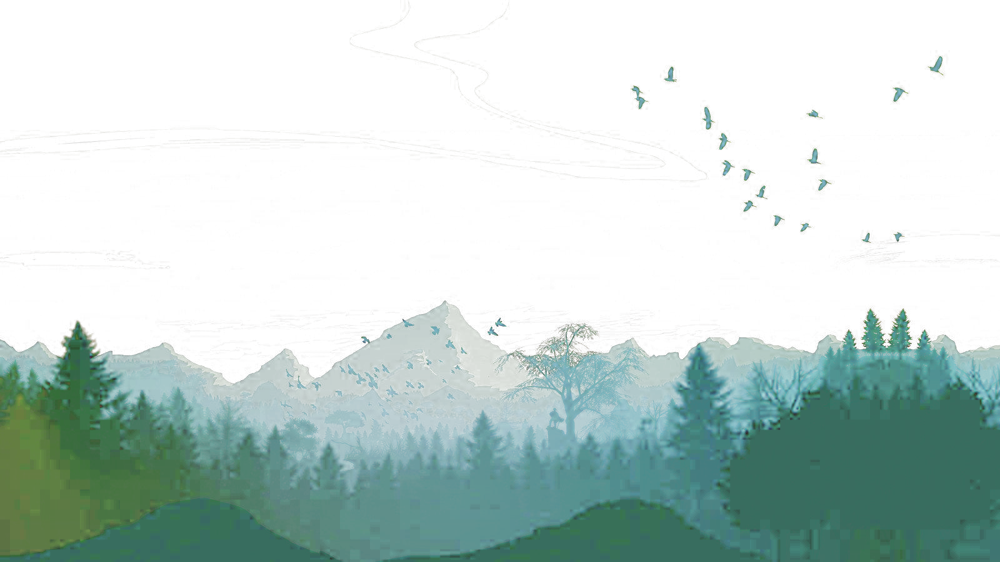

In [36]:
CMYKimg = transformRGB2CMYK(img)
cv2_imshow(CMYKimg)

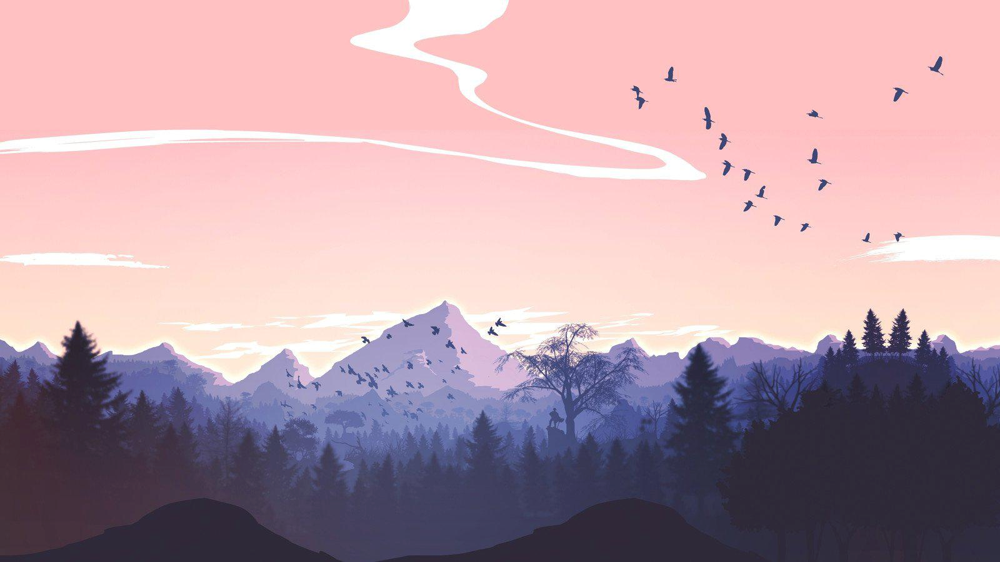

In [37]:
RGBimg = transformCMYK2RGB(CMYKimg)
cv2_imshow(RGBimg)

### To save the file as PDF either 
1. mount your drive to this colab notebook
2. go to files and save a copy of this notebook.
3. go to /content/drive/MyDrive/Colab Notebooks
4. copy path of the copy of the jupyter notebook file and put it in place of file path

                            OR


1.  go to file->print and save file as pdf

                            OR



1.  Download file as jupyter notebook under files.
2. open in VS Code after installing the jupyter extension for vs code
3. go to the 3 dots on the top shelf and choose export and then export as HTML
4. open the HTML file and save it as PDF






In [38]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [39]:
%cd /content

#run these.

!sudo apt-get install texlive-xetex texlive-fonts-recommended texlive-generic-recommended

!jupyter nbconvert --to pdf 'file_path'

/content
Reading package lists... Done
Building dependency tree       
Reading state information... Done
E: Unable to locate package texlive-generic-recommended
[NbConvertApp] WARNING | pattern 'file_path' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--